In [ ]:

# FOR GOOGLE COLAB 
## comment this block when program is on local machine 
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Mounted at /gdrive
/gdrive


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sun Aug 29 11:08:25 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.57.02    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
Train= "/content/drive/MyDrive/time series/train.csv" # change path of ur local device location.
Test= "/content/drive/MyDrive/time series/test.csv" # change path of ur local device location.

In [ ]:
train = pd.read_csv(Train)
test = pd.read_csv(Test)

In [ ]:
train

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10
...,...,...,...,...
912995,2017-12-27,10,50,63
912996,2017-12-28,10,50,59
912997,2017-12-29,10,50,74
912998,2017-12-30,10,50,62


# Exploratory Data Analysis

In [ ]:
train.describe()

,store,item,sales
count,913000.000000,913000.000000,913000.000000
mean,5.500000,25.500000,52.250287
std,2.872283,14.430878,28.801144
min,1.000000,1.000000,0.000000
25%,3.000000,13.000000,30.000000
50%,5.500000,25.500000,47.000000
75%,8.000000,38.000000,70.000000
max,10.000000,50.000000,231.000000


In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype 
---  ------  --------------   ----- 
 0   date    913000 non-null  object
 1   store   913000 non-null  int64 
 2   item    913000 non-null  int64 
 3   sales   913000 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 27.9+ MB


#Memory Reduction and Optimization

*  Since our data is more than a half million and the data we must down cast if they are on int /float 64 to int /float 28 or 16 

*  Changing the date and time from object to pandas date and time 

https://medium.com/@alielagrebi/optimize-the-pandas-dataframe-memory-consuming-for-low-environment-24aa74cf9413

https://pbpython.com/pandas_dtypes.html

In [ ]:
def Memory_Reduction_Optimization(DataFrame):
    cols = DataFrame.dtypes.index.tolist()
    types = DataFrame.dtypes.values.tolist()
    for i,t in enumerate(types):
        if 'int' in str(t):
            if DataFrame[cols[i]].min() > np.iinfo(np.int8).min and DataFrame[cols[i]].max() < np.iinfo(np.int8).max:
                DataFrame[cols[i]] = DataFrame[cols[i]].astype(np.int8)
            elif DataFrame[cols[i]].min() > np.iinfo(np.int16).min and DataFrame[cols[i]].max() < np.iinfo(np.int16).max:
                DataFrame[cols[i]] = DataFrame[cols[i]].astype(np.int16)
            elif DataFrame[cols[i]].min() > np.iinfo(np.int32).min and DataFrame[cols[i]].max() < np.iinfo(np.int32).max:
                DataFrame[cols[i]] = DataFrame[cols[i]].astype(np.int32)
            else:
                DataFrame[cols[i]] = DataFrame[cols[i]].astype(np.int64)
        elif 'float' in str(t):
            if DataFrame[cols[i]].min() > np.finfo(np.float16).min and DataFrame[cols[i]].max() < np.finfo(np.float16).max:
                DataFrame[cols[i]] = DataFrame[cols[i]].astype(np.float16)
            elif DataFrame[cols[i]].min() > np.finfo(np.float32).min and DataFrame[cols[i]].max() < np.finfo(np.float32).max:
                DataFrame[cols[i]] = DataFrame[cols[i]].astype(np.float32)
            else:
                DataFrame[cols[i]] = DataFrame[cols[i]].astype(np.float64)
        elif t == np.object:
            if cols[i] == 'date': #
                DataFrame[cols[i]] = pd.to_datetime(DataFrame[cols[i]], format='%Y-%m-%d')
            else:
                DataFrame[cols[i]] = DataFrame[cols[i]].astype('category')
    return DataFrame  

train = Memory_Reduction_Optimization(train)
test = Memory_Reduction_Optimization(test)

In [ ]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    913000 non-null  datetime64[ns]
 1   store   913000 non-null  int8          
 2   item    913000 non-null  int8          
 3   sales   913000 non-null  int16         
dtypes: datetime64[ns](1), int16(1), int8(2)
memory usage: 10.4 MB


After Downcast we can see there is a substancial memory decrease from 27 Mb to 10.4 Mb

Finding unique values

In [ ]:
train.store.unique() # there are 10 different stores in the dataset

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int8)

In [ ]:
train.item.unique() # and it has 50 products are there in the 

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50],
      dtype=int8)

In [ ]:
train.isna()

,date,store,item,sales
0,False,False,False,False
1,False,False,False,False
2,False,False,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
912995,False,False,False,False
912996,False,False,False,False
912997,False,False,False,False
912998,False,False,False,False


Remove Duplicates in data

In [ ]:
def remove_duplicate(data):
    
    print("BEFORE REMOVING DUPLICATES - No. of Rows = ",data.shape[0])
    data.drop_duplicates(keep="first", inplace=True) 
    print("AFTER REMOVING DUPLICATES  - No. of Rows = ",data.shape[0])
    
    return data

# Remove Duplicates from "train" data :

train = remove_duplicate(train)
test= remove_duplicate(test)

BEFORE REMOVING DUPLICATES - No. of Rows =  913000
AFTER REMOVING DUPLICATES  - No. of Rows =  913000
BEFORE REMOVING DUPLICATES - No. of Rows =  45000
AFTER REMOVING DUPLICATES  - No. of Rows =  45000


In [ ]:
pip install plotly # interactive visualisation

In [ ]:

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px  # for interactive visualisation Plotly
import plotly.graph_objects as go # # for interactive visualisation Plotly 
import datetime as dt
# plotly to work on google colab 
from plotly.offline import iplot
import plotly.io as pio
pio.renderers.default = 'colab'



In [ ]:
# checking plotly lib after rendered specially for colab
import plotly.graph_objects as go
fig = go.Figure( go.Scatter(x=[1,2,3], y=[1,3,2] ) ) # dummy data not related to timeseries analysis
fig.show()

In [ ]:
fig = px.scatter(train, x="store", y="item")
fig.show()

In [ ]:
fig = px.scatter(train, x="store", y="sales")
fig.show()

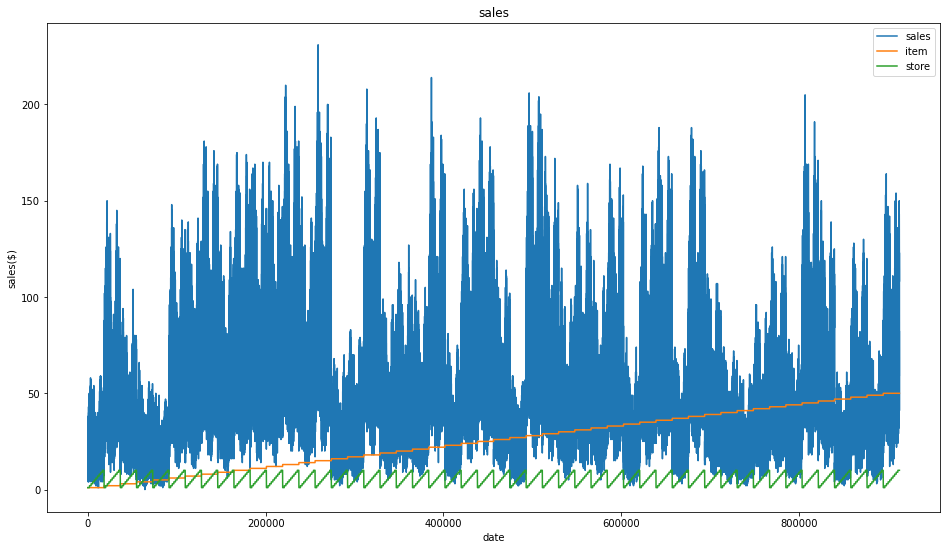

In [ ]:
fig, ax = plt.subplots(figsize=(16,9))
ax.plot(train.sales , label='sales')
ax.plot(train.item , label='item')
ax.plot(train.store , label='store')
#ax.plot(train.date , label='date')
ax.set_xlabel('date')
ax.set_ylabel('sales($)')
ax.set_title("sales")
ax.legend()

In [ ]:
#df_prices_stats =data.loc[:,["Store", "UnitPrice"]]
#df_prices_stats = df_prices_stats.groupby("Store").UnitPrice.agg([min, max, "mean"])

In [ ]:
#df_prices_stats

,min,max,mean
Store,,,
1,0.099976,35.93750,3.210938
2,0.099976,35.93750,3.207031
3,0.099976,51.03125,3.169922
4,0.099976,50.00000,3.351562
5,0.099976,119.50000,3.261719
6,0.119995,85.00000,3.314453
7,0.119995,120.18750,3.390625
8,0.099976,144.50000,3.537109
9,0.099976,240.37500,3.955078


In [ ]:
daily_sales = train.groupby('date', as_index=False)['sales'].sum()
store_daily_sales = train.groupby(['store', 'date'], as_index=False)['sales'].sum()
Product_daily_sales = train.groupby(['item', 'date'], as_index=False)['sales'].sum()


In [ ]:
from plotly.offline import init_notebook_mode, iplot # during offline 
daily_sales_sc = go.Scatter(x=daily_sales['date'], y=daily_sales['sales'])
layout = go.Layout(title='Daily sales', xaxis=dict(title='date'), yaxis=dict(title='sales'))
fig = go.Figure(data=[daily_sales_sc], layout=layout)
iplot(fig)

Daily Sales by Each store

In [ ]:
store_daily_sales_sc = []
for store in store_daily_sales['store'].unique():
    current_store_daily_sales = store_daily_sales[(store_daily_sales['store'] == store)]
    store_daily_sales_sc.append(go.Scatter(x=current_store_daily_sales['date'], y=current_store_daily_sales['sales'], name=('Store %s' % store)))

layout = go.Layout(title='Store daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=store_daily_sales_sc, layout=layout)
iplot(fig)

Each Item Sales

In [ ]:
`Product_daily_sales_sc = []
for Product in Product_daily_sales['item'].unique():
    current_Product_daily_sales = Product_daily_sales[(Product_daily_sales['item'] == Product)]
    Product_daily_sales_sc.append(go.Scatter(x=current_Product_daily_sales['date'], y=current_Product_daily_sales['sales'], name=('item %s' % Product)))

layout = go.Layout(title='item daily sales', xaxis=dict(title='date'), yaxis=dict(title='sales'))
fig = go.Figure(data=Product_daily_sales_sc, layout=layout)
iplot(fig)

# Time series Data Exploratory Analysis

# Seasonality Decompose 

Decomposition is primarily used for time series analysis, and as an analysis tool it can be used to inform forecasting models in our problem

All time series data can be broken down into four core components: the average value, a trend (i.e. an increasing mean), seasonality (i.e. a repeating cyclical pattern), and a residual (random noise). Trends and seasonality are not always present in time dependent data. The residual is what’s left over after trends and seasonality are removed. Time series models assume that the data is stationary and only the residual component satisfies the conditions for stationarity


We use seasonal_decompose import to calculate the sesonality of the data based on the 4 terms 

(Original,Trend,Seasonal,Residual).

seasonal_decompose method parameter  has 'freq' which is the key aspect here 

* freq = 365 : trend of year.
* freq = 30 : trend of month.
* freq = 7 : trend of week.

*  https://www.statsmodels.org/stable/generated/statsmodels.tsa.seasonal.seasonal_decompose.html

*  https://machinelearningmastery.com/decompose-time-series-data-trend-seasonality/

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [ ]:
train = train.set_index('date')

In [ ]:
import matplotlib as mpl
mpl.rcParams['agg.path.chunksize'] = 1000 #  to avoid OverflowError: Exceeded cell block limit (set 'agg.path.chunksize' rcparam) which we faced.

# Additive

An additive model suggests that the components are added together as follows:

y(t) = Level + Trend + Seasonality + Noise
1
y(t) = Level + Trend + Seasonality + Noise
An additive model is linear where changes over time are consistently made by the same amount.

A linear trend is a straight line.

A linear seasonality has the same frequency (width of cycles) and amplitude (height of cycles).

'freq=365' == > data is for long term.

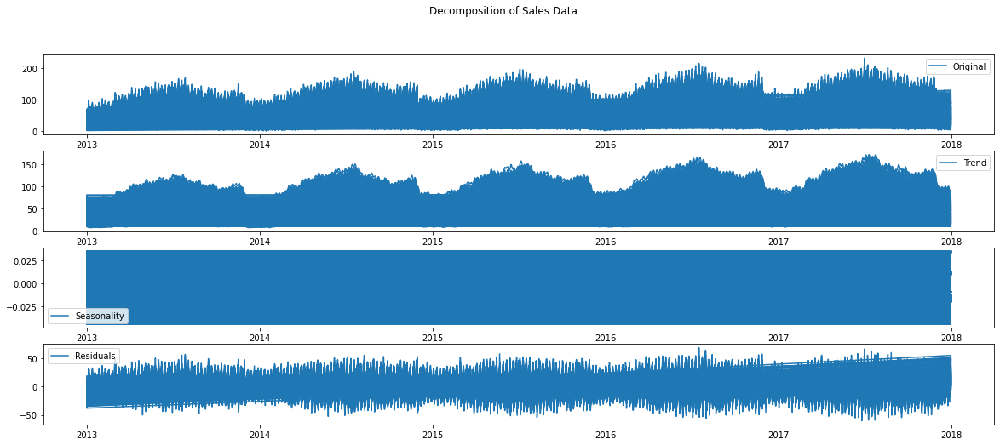

In [ ]:
result = seasonal_decompose(train['sales'], model='additive', freq=365)

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid
fig = plt.figure(figsize=(20,8))
plt.subplot(411)
plt.plot(train['sales'], label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal,label='Seasonality')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residuals')
plt.legend(loc='best')

fig.suptitle('Decomposition of Sales Data')
plt.show()

checking Around with Frequency

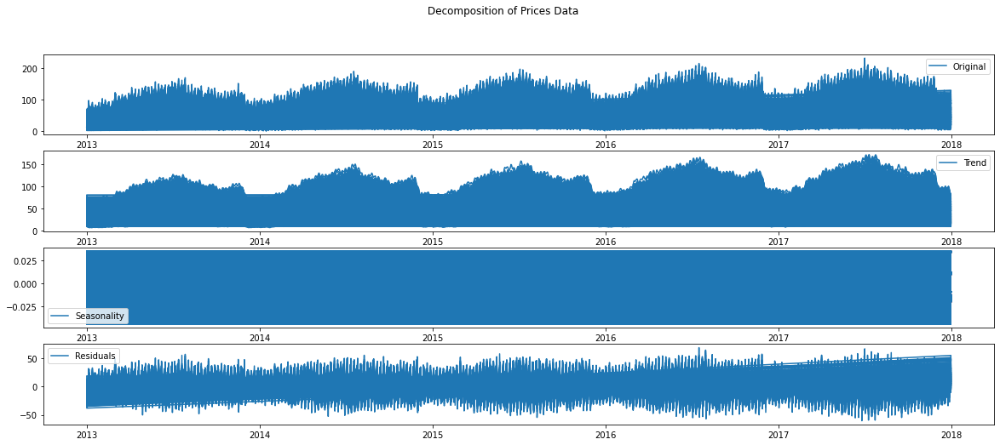

In [ ]:

# when frequency = 10 , additiove model 
decomposition = seasonal_decompose(train['sales'], model='additive', freq = 10)

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid
fig = plt.figure(figsize=(20,8))
plt.subplot(411)
plt.plot(train['sales'], label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal,label='Seasonality')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residuals')
plt.legend(loc='best')

fig.suptitle('Decomposition of Sales Data')
plt.show()

# Multiplicative

A multiplicative model suggests that the components are multiplied together as follows:

y(t) = Level * Trend * Seasonality * Noise
1
y(t) = Level * Trend * Seasonality * Noise

A multiplicative model is nonlinear, such as quadratic or exponential. Changes increase or decrease over time.

A nonlinear trend is a curved line.

A non-linear seasonality has an increasing or decreasing frequency and/or amplitude over time.

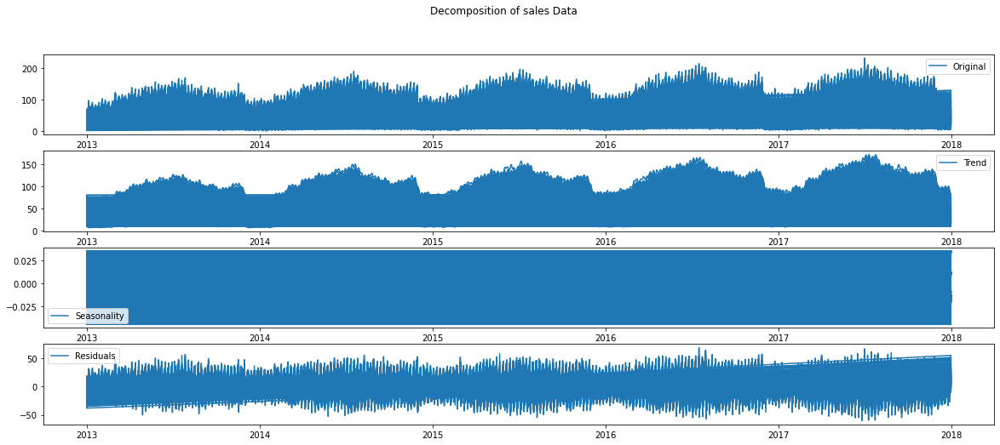

In [ ]:
decomposition = seasonal_decompose(train['sales'], model='Multiplicative', freq = 10)

trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid
fig = plt.figure(figsize=(20,8))
plt.subplot(411)
plt.plot(train['sales'], label='Original')
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend')
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal,label='Seasonality')
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residuals')
plt.legend(loc='best')

fig.suptitle('Decomposition of sales Data')
plt.show()

# Rolling Statistics

Using pandas rolling function 

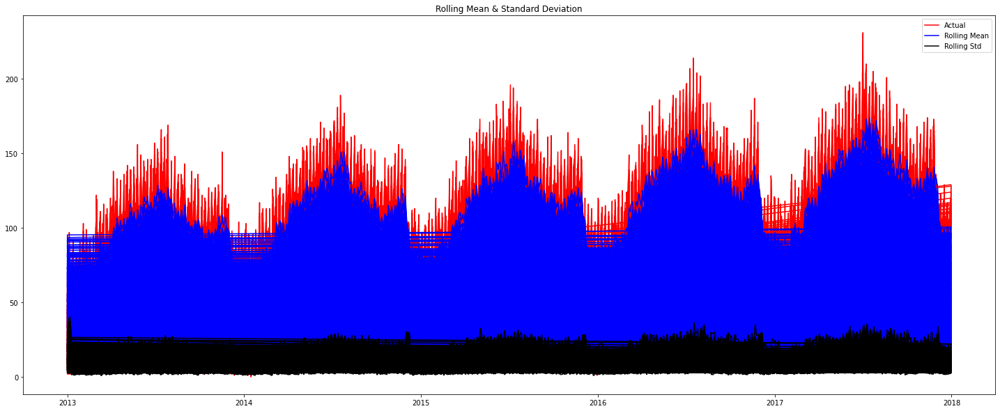

In [ ]:
def statistics(timeseries, window = 10):

    # Moving Average window for 10 days
    rolmean = timeseries.rolling(window).mean()
    rolstd = timeseries.rolling(window).std()

    # rolling statistics:
    fig = plt.figure(figsize=(25, 10))
    actual = plt.plot(timeseries, color='red',label='Actual')
    mean = plt.plot(rolmean, color='blue', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean with Standard Deviation')
    plt.show()
statistics(train['sales'])

# Dickey-Fuller Test

Checking for the Stationary : ADFULLER TEST - (Dickey-Fuller) To find the observaton is stationary or not if the p Value is < 0.05 its stationary when the p value is > 0.05 its not stationary

Here we basically will find the Strong Evidence or Weak Evidence of Null Hypoyhesis Using P value.

*  Null Hypothesis (H0): If failed to be rejected, it suggests the time series has a unit root, meaning it is non-stationary. It has some time dependent structure.

*  Alternate Hypothesis (H1): The null hypothesis is rejected; it suggests the time series does not have a unit root, meaning it is stationary. It does not have time-dependent structure.

*  https://en.wikipedia.org/wiki/Dickey%E2%80%93Fuller_test

*   https://machinelearningmastery.com/time-series-data-stationary-python/

In [ ]:
from statsmodels.tsa.stattools import adfuller

def ad_test(dataset,cutoff = 0.01 ):  
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller(DF) Test:')
    dftest = adfuller(dataset, autolag='AIC', maxlag = 20 )
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    pvalue = dftest[1]
    if pvalue < cutoff:
        print("strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary")
        print(' p-value = %.4f. The series is likely stationary.'  % pvalue)
    else:
        print('weak evidence against null hypothesis, time series has a unit root, indicating it is non-stationary')
        print(' p-value = %.4f. The series is likely non-stationary.' % pvalue)
    
    print(dfoutput)
ad_test(train['sales'])

Results of Dickey-Fuller Test:
strong evidence against the null hypothesis(Ho), reject the null hypothesis. Data has no unit root and is stationary
 p-value = 0.0000. The series is likely stationary.
Test Statistic                    -23.116590
p-value                             0.000000
#Lags Used                         20.000000
Number of Observations Used    912979.000000
Critical Value (1%)                -3.430357
Critical Value (5%)                -2.861543
Critical Value (10%)               -2.566772
dtype: float64


# Moving Average 

Moving Average is used to calculate and analyse the data points by creating a series of average of subsets of the full data. 
Moving Average in Financial Analysis is used to calculate the moving average of stocks to smooth out the price data by creating a constant updated average price.


* Golden Cross: When short-term moving average crosses the long-term moving average

* Death Cross : which is exactly opposite when short-term moving averages moves below long-term moving average it’s a death cross 


In [ ]:
RollingMean = train['sales'].rolling(window = 12).mean()
RollingSTD = train['sales'].rolling(window = 12).std()
print(RollingMean)
print(RollingSTD)

0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
912995    61.250000
912996    61.833333
912997    60.833333
912998    61.583333
912999    63.916667
Name: sales, Length: 913000, dtype: float64
0               NaN
1               NaN
2               NaN
3               NaN
4               NaN
            ...    
912995    13.239919
912996    12.946276
912997    11.264048
912998    10.991388
912999    12.146517
Name: sales, Length: 913000, dtype: float64


# 7 days Moving Average of Sales using Plotly Library for Visualisation

In [ ]:
# 3 Dimentional Scatter Visulaisation of the Simple Moving Average of sales

train['Moving Average-7days'] = train['sales'].rolling(window=7).mean()
fig = px.line(train, x="sales", y="Moving Average-7days")#, z="date")
fig.update_layout(title= "2 Dimentional Line Visulaisation of the Simple Moving Average of store sales")
fig.show()

Tried implementing the Moving Average for 7 days using the Pandas rolling window option the calculation was successfull but we cannot view the interactive visualisation of plotly. 

Next will try with the other MatplotLibrary for the Moving Average and lets see the response of the visualisation

# Moving Average using the MatPlotLibrary 

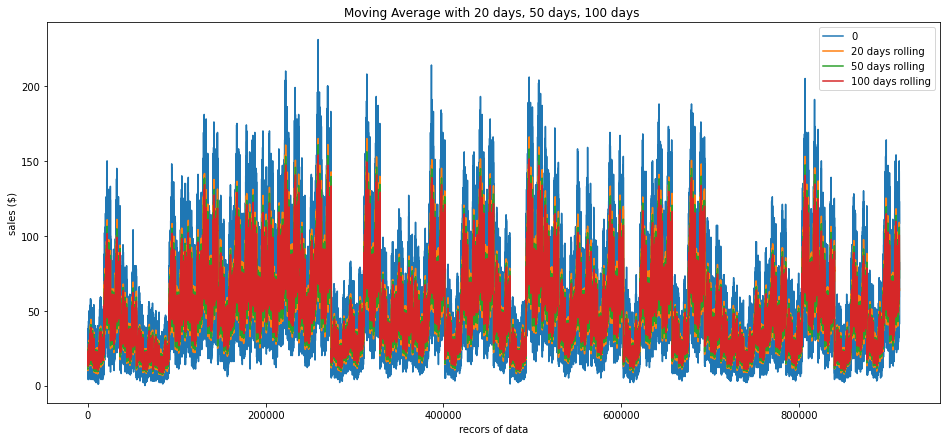

In [ ]:
lista=[train]
for count, a in enumerate (lista):
    def movingavwerage(name):
        company = name['sales']
        
        short_company = company.rolling(window=20).mean()
        short_company1 = company.rolling(window=50).mean()
        long_company = company.rolling(window=100).mean()
        rolling= short_company ,short_company1,long_company
        # Plot everything by leveraging the very powerful matplotlib package
        fig, ax = plt.subplots(figsize=(16,7))

     
      #  for ma in ma_day:
        ax.plot(company.index,company, label= count)
        ax.plot(short_company.index, short_company, label='20 days rolling')
        ax.plot(short_company1.index, short_company1, label='50 days rolling')
        ax.plot(long_company.index, long_company, label='100 days rolling')

        ax.set_xlabel('records of data')
        ax.set_ylabel('sales ($)')
        ax.set_title("Moving Average with 20 days, 50 days, 100 days ")
        ax.legend()
        return rolling

    movingavwerage(a)
    # 0----> ACTUAL


Now we can see the Visulatisation and the calculations

# Drawback of Plotly for Interactive Visualisation study

As we can see that plotly libray has not that much user friendly with the large number of data, instead Matplotlibrbry supports the large data sets with more than 1 million Also

From our Micro Research :

Plotly Supposts less than 7 Lakhs or 7,00,000 data points

In [ ]:
from scipy import stats # Stats
import statsmodels.api as sm # Here we will be using StatsModel for ARIMA
import warnings # Warnings
from itertools import product

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



# Autocorrelation and Partial AutoCorrelation

https://machinelearningmastery.com/gentle-introduction-autocorrelation-partial-autocorrelation/

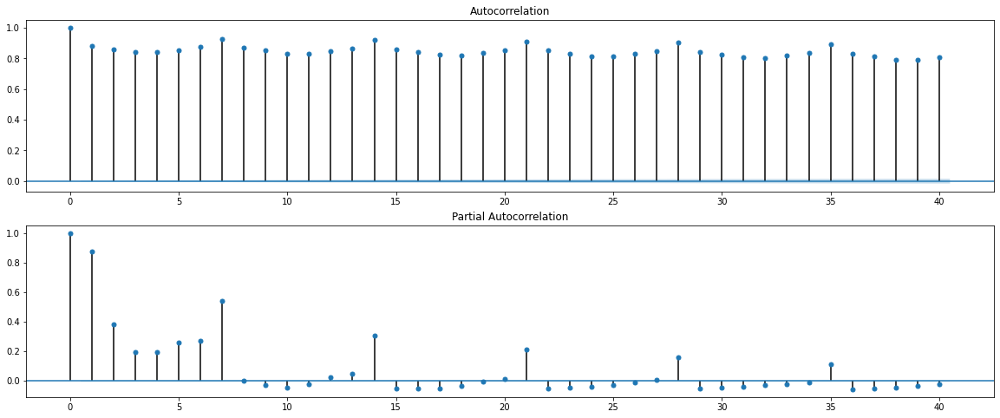

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
from matplotlib import pyplot
pyplot.figure(figsize=(20,8))
pyplot.subplot(211)
plot_acf(train['sales'], ax=pyplot.gca(),lags=40)
pyplot.subplot(212)
plot_pacf(train['sales'], ax=pyplot.gca(), lags=40)
pyplot.show()

From the Above diagram we can tell that our best Model will be 717

* p: The number of lag observations included in the model, also called the lag order. = 7 ( Look partial Auto corellation for X axis---0 to 7 and within 7 lags AR is Significant 
* d: The number of times that the raw observations are differenced, also called the degree of differencing. =1 : we see the first order differencing make the ts stationary. I = 1
* q: The size of the moving average window, also called the order of moving average =7


Reference:

* https://www.researchgate.net/post/How-does-one-determine-the-values-for-ARp-and-MAq

* https://stats.stackexchange.com/questions/281666/how-does-acf-pacf-identify-the-order-of-ma-and-ar-terms/281726#281726

* https://stats.stackexchange.com/questions/134487/analyse-acf-and-pacf-plots?rq=1

# ARIMA Modelling

AR = Corellation between the previous time to the Current time I= M=

AUTOREG REGRESSION: This basically means that you are using the previous values of the time series in order to predict the future. How many past values you use, determine the order of the AR model. Here’s how an AR(1) model looks like:
 
* Y(t)= Some_Constant*Y(t-1)+ Another_Constant +Error(t)

The parameters of the ARIMA model are defined as follows:

* p: The number of lag observations included in the model, also called the lag order. 
* d: The number of times that the raw observations are differenced, also called the degree of differencing.
* q: The size of the moving average window, also called the order of moving average.

Here we are doing in a Stats Way .

Arima Model-0

Training on Full data set of 912999 Records.

# Process to find the values of p, d, q 

There are a number of ways, and I don't intend this to be exhaustive:

*  look at an autocorrelation graph of the data (will help if Moving Average (MA) model is appropriate)

*  look at a partial autocorrelation graph of the data (will help if AutoRegressive (AR) model is appropriate)

*  look at extended autocorrelation chart of the data (will help if a combination of AR and MA are needed)

*  try Akaike's Information Criterion (AIC) on a set of models and investigate the models with the lowest AIC values

*  try the Schwartz Bayesian Information Criterion (BIC) and investigate the models with the lowest BIC values

https://stats.stackexchange.com/questions/44992/what-are-the-values-p-d-q-in-arima

In [ ]:
arima = sm.tsa.ARIMA(train.sales, (6,1,0))
result_arima= arima.fit(disp=False)
print(result_arima.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



                             ARIMA Model Results                              
Dep. Variable:                D.sales   No. Observations:                 1825
Model:                 ARIMA(6, 1, 0)   Log Likelihood               -5597.668
Method:                       css-mle   S.D. of innovations              5.195
Date:                Sun, 29 Aug 2021   AIC                          11211.335
Time:                        14:16:46   BIC                          11255.410
Sample:                    01-02-2013   HQIC                         11227.594
                         - 12-31-2017                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0039      0.025      0.152      0.879      -0.046       0.054
ar.L1.D.sales    -0.8174      0.022    -37.921      0.000      -0.860      -0.775
ar.L2.D.sales    -0.7497      0.026    -

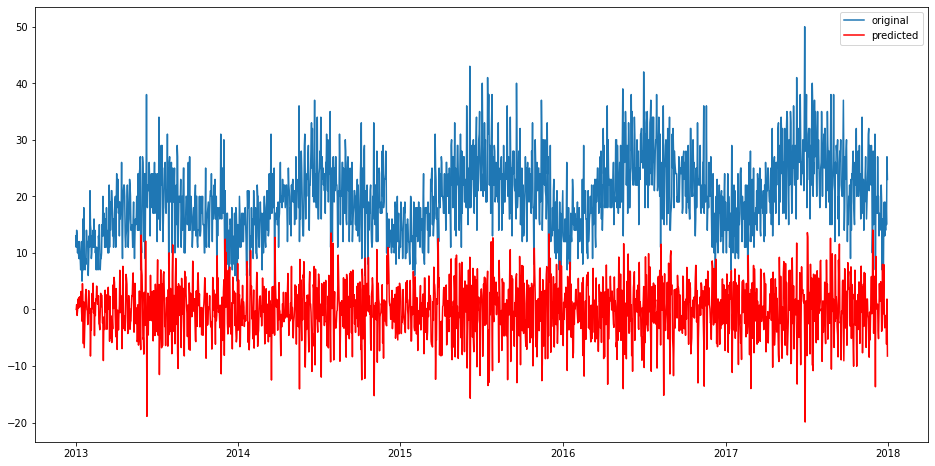

In [ ]:
plt.figure(figsize=(16,8))
plt.plot(train.sales,  label='original')
plt.plot(result_arima.fittedvalues, color='red', label='predicted')
plt.legend(loc='best')
plt.show()

# On refining the ARIMA Model-1

In [ ]:
arima_mod1 = sm.tsa.statespace.SARIMAX(train.sales, trend='n', order=(6,1,0)).fit()
print(arima_mod1.summary())

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



                           Statespace Model Results                           
Dep. Variable:                  sales   No. Observations:                 1826
Model:               SARIMAX(6, 1, 0)   Log Likelihood               -5597.679
Date:                Sun, 29 Aug 2021   AIC                          11209.359
Time:                        15:02:32   BIC                          11247.924
Sample:                    01-01-2013   HQIC                         11223.585
                         - 12-31-2017                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8174      0.021    -39.063      0.000      -0.858      -0.776
ar.L2         -0.7497      0.025    -30.480      0.000      -0.798      -0.702
ar.L3         -0.6900      0.026    -26.686      0.0

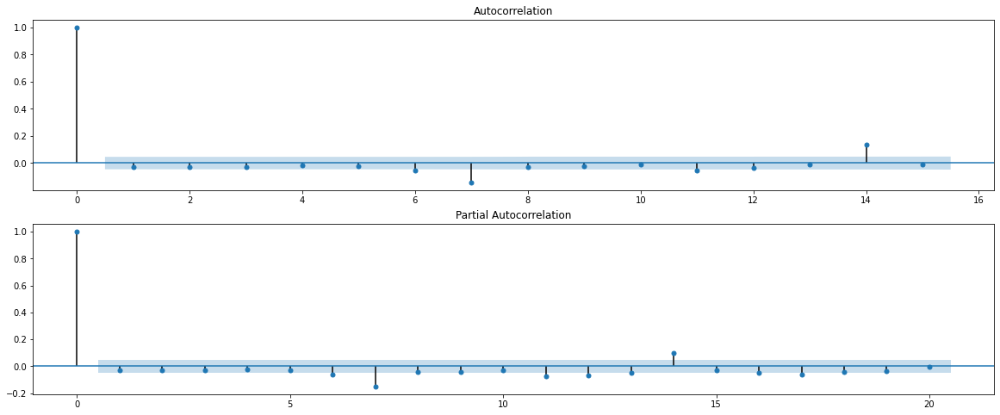

In [ ]:
residual = arima_mod1.resid
fig = plt.figure(figsize=(20,8))
ax1 = fig.add_subplot(211)
fig= sm.graphics.tsa.plot_acf(residual,lags=15, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(residual, lags = 20, ax=ax2)

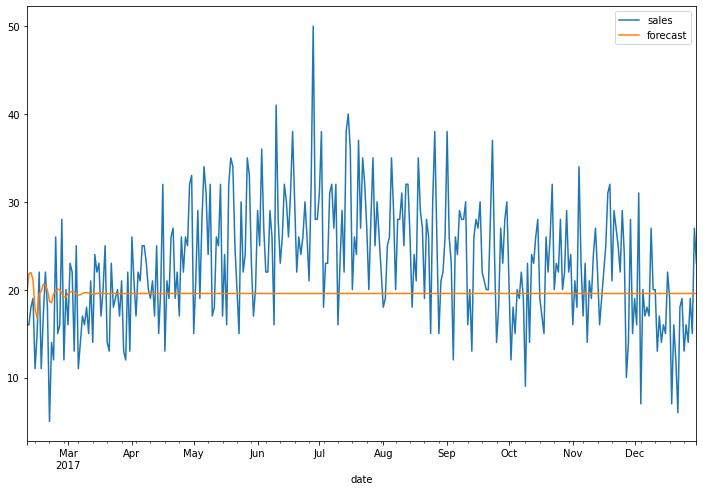

In [ ]:
# for 1 year from jan 2017 till december 2017 this is done to reduce the opperation and training time, below in the last coding snippet 
# will include a full training with forecast
start_index = 1500
end_index = 1826
train['forecast'] = arima_mod1.predict(start = start_index, end= end_index, dynamic= True)  
train[start_index:end_index][['sales', 'forecast']].plot(figsize=(12, 8))

In [ ]:
def error(train, pred):
    mape = np.mean(abs((train-pred)/train))*100
    smape = np.mean((np.abs(pred - train) * 200/ (np.abs(pred) + np.abs(train))).fillna(0))
    print('MAPE: %.2f %% \nSMAPE: %.2f'% (mape,smape), "%")

In [ ]:
error(train[start_index:end_index]['sales'],train[start_index:end_index]['forecast'])

MAPE: 26.97 % 
SMAPE: 27.12 %


# Model 2

In [ ]:
# rechanging the test and train data as we have seen both previous models were slightly improving from each other 

tr_start,tr_end = '2014-01-01','2017-09-30' # specified date index for train
te_start,te_end = '2017-10-01','2017-12-31' # specified date index for test
tra = train['sales'][tr_start:tr_end].dropna()
tes = train['sales'][te_start:te_end].dropna()

In [ ]:
arima1 = sm.tsa.statespace.SARIMAX(tra,order=(7,1,7),freq='D',seasonal_order=(0,0,0,0),
                                 enforce_stationarity=False, enforce_invertibility=False,).fit()
arima1.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                  sales   No. Observations:                 1369
Model:               SARIMAX(7, 1, 7)   Log Likelihood               -4068.714
Date:                Sun, 29 Aug 2021   AIC                           8167.428
Time:                        14:57:04   BIC                           8245.657
Sample:                    01-01-2014   HQIC                          8196.714
                         - 09-30-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8967      0.036    -24.700      0.000      -0.968      -0.826
ar.L2         -0.8998      0.036    -24.898      0.000      -0.971      -0.829
ar.L3         -0.8965      0.036    -24.894      0.000      -0.967      -0.826
ar.L4         -0.8922      0.036    -24.642      0.000      -0.963      -0.821
ar.L5         -0.8976      0.035    -25.683      0.000      -0.966      -0.829
ar.L6         -0.8924      0.036    -24.832      0.000      -0.963      -0.822
ar.L7          0.0984      0.035      2.806      0.005       0.030       0.167
ma.L1          0.0571      0.022      2.631      0.009       0.015       0.100
ma.L2          0.0985      0.020      4.873      0.000       0.059       0.138
ma.L3          0.0365      0.021      1.746      0.081      -0.004       0.077
ma.L4          0.0552      0.020      2.742      0.006       0.016       0.095
ma.L5          0.0956      0.020      4.792      0.000       0.057       0.135
ma.L6          0.0760      0.021      3.617      0.000       0.035       0.117
ma.L7         -0.8602      0.019    -45.752      0.000      -0.897      -0.823
sigma2        24.6825      0.995     24.815      0.000      22.733      26.632
===================================================================================
Ljung-Box (Q):                       46.36   Jarque-Bera (JB):                10.03
Prob(Q):                              0.23   Prob(JB):                         0.01
Heteroskedasticity (H):               1.34   Skew:                             0.14
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.31
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

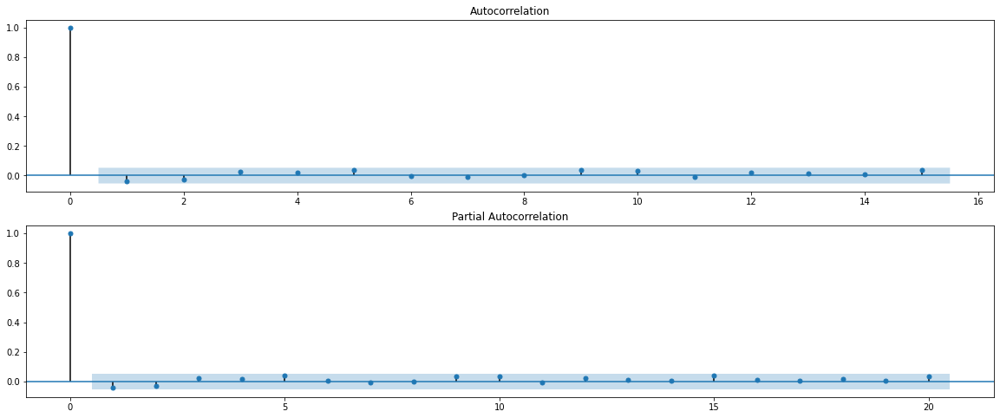

In [ ]:
residual = arima1.resid
fig = plt.figure(figsize=(20,8))
ax1 = fig.add_subplot(211)
fig= sm.graphics.tsa.plot_acf(residual,lags=15, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(residual, lags = 20, ax=ax2)

In [ ]:
from sklearn.metrics import mean_squared_error
pred = arima1.predict(tr_end,te_end)[1:]


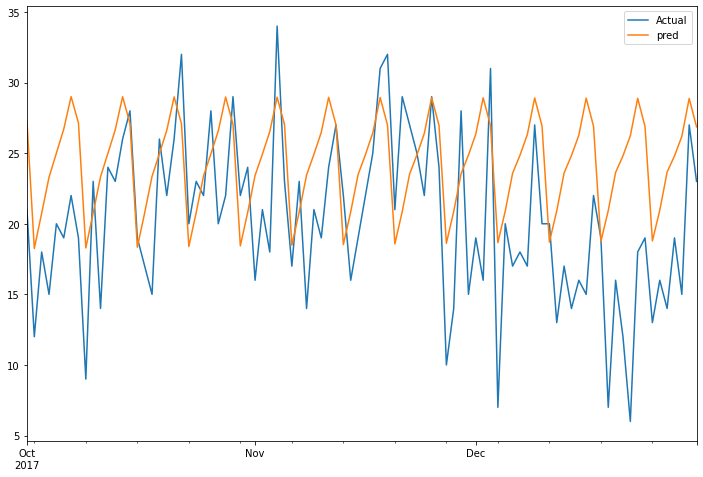

In [ ]:
pd.DataFrame({'Actual':tes,'pred':pred}).plot(figsize=(12, 8));plt.show()

We can see we need some more refining of the modelling, so that the predicted model matches well.


Dickey Fuller test Statistic:     -38.501745
P-Value:                            0.000000
Lags Used:                          0.000000
No. Of observations:             1368.000000
dtype: float64


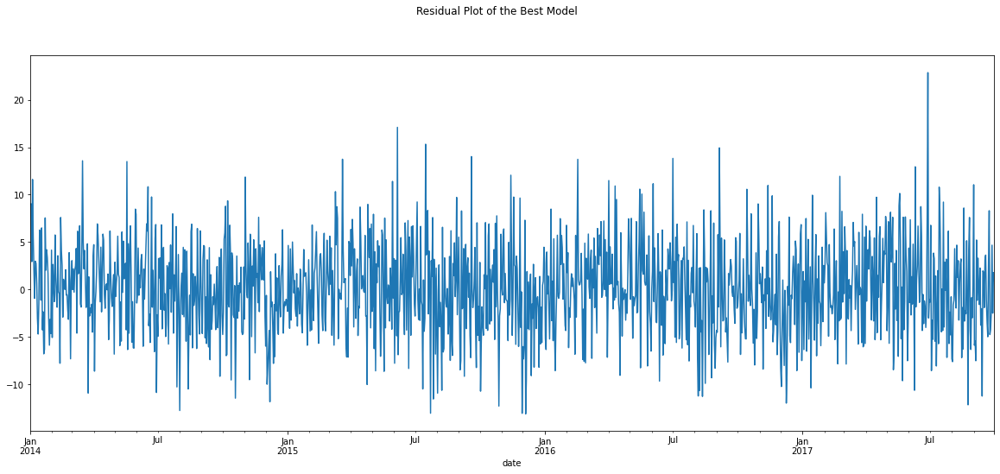

In [ ]:
fig = plt.figure(figsize=(20,8))
arima1.resid.plot()
fig.suptitle('Residual Plot of the Best Model')
test1 = adfuller(arima1.resid, autolag='AIC') 
result1 = pd.Series(test1[0:4], index=['Dickey Fuller test Statistic:','P-Value:','Lags Used:','No. Of observations:'])
print(result1)

In [ ]:
print('ARIMA model-2 MSE:{}'.format(mean_squared_error(tes,pred)))
def error(train, pred):
    mape = np.mean(abs((train-pred)/train))*100
    smape = np.mean((np.abs(pred - train) * 200/ (np.abs(pred) + np.abs(train))).fillna(0))
    print('MAPE: %.2f %% \nSMAPE: %.2f'% (mape,smape), "%")


ARIMA model-2 MSE:45.02463730156087


In [ ]:
error(tes,pred)

MAPE: 37.01 % 
SMAPE: 27.47 %


ARIMA is pretty close with the test data prediction 

Now lets try with the sarima modelling for time series analysis

# SARIMA

As a quick overview, SARIMA models are ARIMA models with a seasonal component.

As per the formula SARIMA(p,d,q)x(P,D,Q,s), the parameters for these types of models are as follows:

p and seasonal P: indicate number of autoregressive terms (lags of the stationarized series)

d and seasonal D: indicate differencing that must be done to stationarize series

q and seasonal Q: indicate number of moving average terms (lags of the forecast errors)

s: indicates seasonal length in the data

https://towardsdatascience.com/time-series-forecasting-with-a-sarima-model-db051b7ae459

In [ ]:
# parameters of P,D,Q,S
sarima = sm.tsa.statespace.SARIMAX(tra,order=(7,1,7),seasonal_order=(7,1,7,1),
                                enforce_stationarity=False, enforce_invertibility=False,freq='D').fit()
sarima.summary()

/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                
=========================================================================================
Dep. Variable:                             sales   No. Observations:                 1369
Model:             SARIMAX(7, 1, 7)x(7, 1, 7, 1)   Log Likelihood               -4070.506
Date:                           Sun, 29 Aug 2021   AIC                           8199.013
Time:                                   14:32:48   BIC                           8350.084
Sample:                               01-01-2014   HQIC                          8255.585
                                    - 09-30-2017                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9030      0.779     -1.160      0.246      -2.429       0.623
ar.L2         -0.8915      0.783     -1.139      0.255      -2.425       0.642
ar.L3         -0.8724      0.773     -1.128      0.259      -2.388       0.643
ar.L4         -0.8693      0.749     -1.160      0.246      -2.338       0.600
ar.L5         -0.8806      0.737     -1.196      0.232      -2.324       0.563
ar.L6         -0.8955      0.740     -1.210      0.226      -2.346       0.555
ar.L7          0.0897      0.756      0.119      0.906      -1.392       1.571
ma.L1         -0.0835      0.021     -4.060      0.000      -0.124      -0.043
ma.L2         -0.0734      0.019     -3.889      0.000      -0.110      -0.036
ma.L3         -0.0593      0.021     -2.773      0.006      -0.101      -0.017
ma.L4         -0.0542      0.023     -2.359      0.018      -0.099      -0.009
ma.L5         -0.0053      0.020     -0.259      0.795      -0.045       0.035
ma.L6         -0.0289      0.021     -1.408      0.159      -0.069       0.011
ma.L7         -0.9633      0.021    -45.503      0.000      -1.005      -0.922
ar.S.L1       -0.9091      0.781     -1.164      0.245      -2.440       0.622
ar.S.L2       -0.8562      0.772     -1.109      0.267      -2.369       0.656
ar.S.L3       -0.8882      0.721     -1.231      0.218      -2.302       0.526
ar.S.L4       -0.8691      0.729     -1.192      0.233      -2.299       0.560
ar.S.L5       -0.8871      0.701     -1.266      0.206      -2.261       0.487
ar.S.L6       -0.8530      0.714     -1.195      0.232      -2.252       0.546
ar.S.L7        0.0421      0.689      0.061      0.951      -1.308       1.392
ma.S.L1       -0.0835      0.021     -4.060      0.000      -0.124      -0.043
ma.S.L2       -0.0734      0.019     -3.889      0.000      -0.110      -0.036
ma.S.L3       -0.0593      0.021     -2.773      0.006      -0.101      -0.017
ma.S.L4       -0.0542      0.023     -2.359      0.018      -0.099      -0.009
ma.S.L5       -0.0053      0.020     -0.259      0.795      -0.045       0.035
ma.S.L6       -0.0289      0.021     -1.408      0.159      -0.069       0.011
ma.S.L7       -0.9633      0.021    -45.502      0.000      -1.005      -0.922
sigma2        19.9076      0.834     23.857      0.000      18.272      21.543
===================================================================================
Ljung-Box (Q):                       45.67   Jarque-Bera (JB):                 6.99
Prob(Q):                              0.25   Prob(JB):                         0.03
Heteroskedasticity (H):               1.39   Skew:                             0.11
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.27
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covarianc

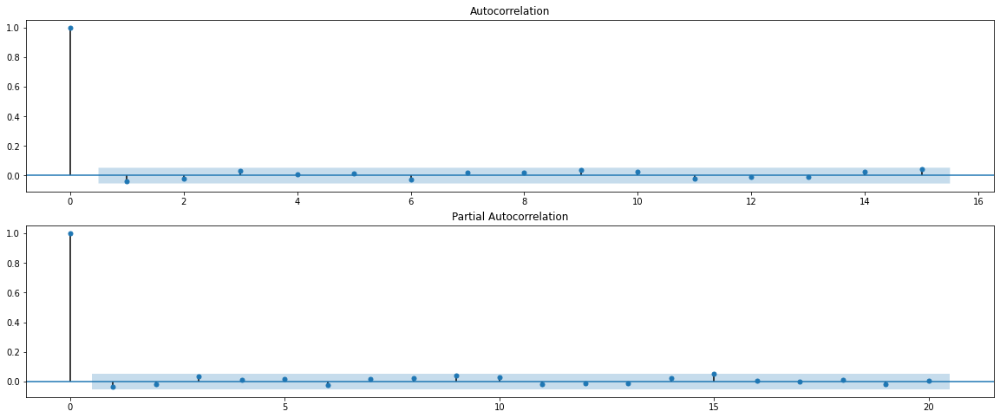

In [ ]:
from statsmodels.tsa.stattools import adfuller

residual = sarima.resid
fig = plt.figure(figsize=(20,8))
ax1 = fig.add_subplot(211)
fig= sm.graphics.tsa.plot_acf(residual,lags=15, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(residual, lags = 20, ax=ax2)

Dickey Fuller test Statistic:     -38.467788
P-Value:                            0.000000
Lags Used:                          0.000000
No. Of observations:             1368.000000
dtype: float64


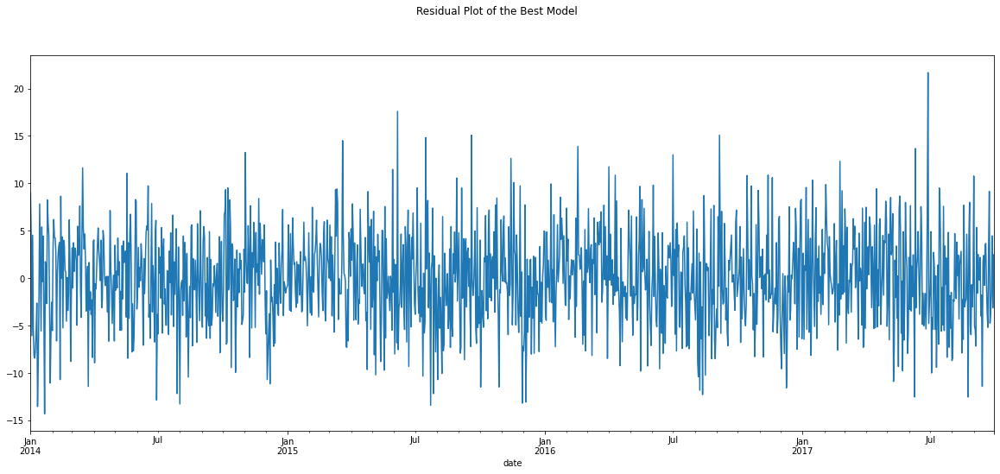

In [ ]:
fig = plt.figure(figsize=(20,8))
sarima.resid.plot()
fig.suptitle('Residual Plot of the Best Model')
test1 = adfuller(sarima.resid, autolag='AIC') 
result1 = pd.Series(test1[0:4], index=['Dickey Fuller test Statistic:','P-Value:','Lags Used:','No. Of observations:'])
print(result1)

In [ ]:
pred = sarima.predict(tr_end,te_end)[1:]
print('SARIMA model MSE:{}'.format(mean_squared_error(tes,pred)))

SARIMA model MSE:28.230794573896606


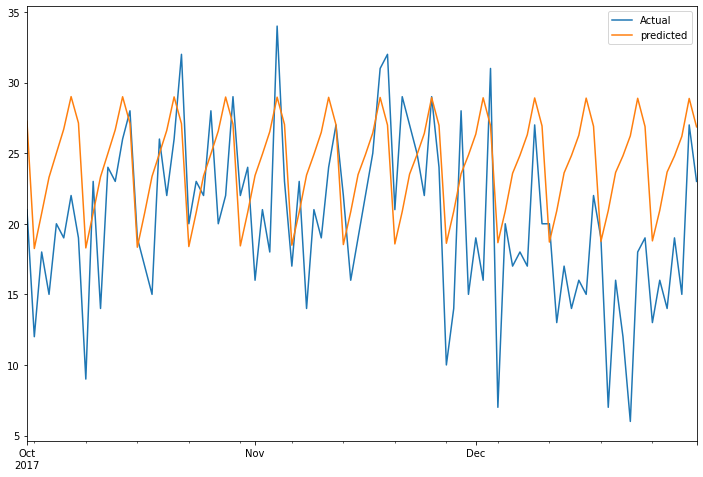

In [ ]:
pd.DataFrame({'Actual':tes,'predicted':pred}).plot(figsize=(12, 8));plt.show()

In [ ]:
error(tes,pred)

MAPE: 27.19 % 

SMAPE: 21.93 %

Sarima prediction are close 

From this study we can tell that the ARIMA and The SARIMA Performs well as expected, with good training and we can further improve as well and lets see the response form the LSTM, Prophet

End of this Part ! 

### SARIMAX for Sales forecasting full training

In [ ]:
Qs = range(0, 2)
qs = range(0, 4)
Ps = range(0, 4)
ps = range(0, 2)
D=1
d=1
parameters = product(ps, qs, Ps, Qs) #SARIMAX model Parameters:(p,d,q)(sp,sd,sq,s) +exog
parameterslist = list(parameters)
len(parameterslist)
results = []
bestaic = float("inf")
warnings.filterwarnings("ignore")
for param in parameterslist:
    try:
        model=sm.tsa.statespace.SARIMAX(train['sales'], order=(param[0], d, param[1]),seasonal_order=(param[2],D, param[3],12),enforce_stationarity=False,enforce_invertibility=False).fit(disp=-1)
    except ValueError:
        continue
    aic = model.aic
    if aic < bestaic:
        model1 = model
        aic1 = aic
        param1 = param
    results.append([param, model.aic]

In [ ]:
result = pd.DataFrame(results)
result.columns = ['parameters', 'aic']
print(result.sort_values(by = 'aic', ascending=True).head())
print(model1.summary())

In [ ]:
# Autocorrelation and Partial AutoCorrelation Plot for Residual
residual = model1.resid
fig = plt.figure(figsize=(20,8))
ax1 = fig.add_subplot(211)
fig= sm.graphics.tsa.plot_acf(residual,lags=15, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(residual, lags = 20, ax=ax2)

In [ ]:
fig = plt.figure(figsize=(20,8))
model1.resid.plot()
fig.suptitle('Residual Plot of the Best Model')
test1 = adfuller(model1.resid, autolag='AIC') 
result1 = pd.Series(test1[0:4], index=['Dickey Fuller test Statistic:','P-Value:','Lags Used:','No. Of observations:'])
print(result1)

In [ ]:
by_month = data[['Sales']]
upcoming = pd.DataFrame()
by_month = pd.concat([by_month,upcoming])
by_month['forecast'] = model1.predict(start=0, end=200)
plt.figure(figsize=(20,8))
plt.title(' Forecast of sales ' )
plt.xlabel('Months')
plt.ylabel('Mean sales')
by_month['Sales'].plot()
by_month.forecast.plot(color='red', ls='--', label='Predictedsales')
plt.legend()
plt.show()